In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
cd /g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore

/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore


In [3]:
import sys
import os
import re
from matplotlib import pyplot as plt
from pprint import pprint
from intake import open_esm_datastore
import pandas as pd
import cftime
import cf_xarray
import xarray as xr
from datetime import datetime
from dateutil.relativedelta import relativedelta
tool_dir = '/g/data/tm70/ml0072/COMMON/git_repos/fork_access-eval-recipes/ml_create_own_datastore'
sys.path.append(tool_dir)
from plot_functions import _expt_fullname, _read_ryaml, plot_time_series, plot2d
from dask.distributed import Client

In [4]:
pics_folder = "send_to_gfdl"
pics_folder = os.path.join(tool_dir, pics_folder)
os.makedirs(pics_folder, exist_ok=True)

In [5]:
expts_manager_path = '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager'
yaml_input = os.path.join(expts_manager_path, 'Expts_manager_025deg_restart_rest.yaml')
yamlfile_path = os.path.join(tool_dir,yaml_input)
yaml_input = _read_ryaml(yamlfile_path)
test_rel_path = yaml_input['test_path']
MOM_contrl_dir = yaml_input['base_dir_name']
contrl_name = 'DT_THERM_1350_DIABATIC_FIRST_True'
MOM_expt_dir3 = yaml_input['namelists']['MOM_input']['MOM_input_dirs_restart_rest']
MOM_list3_combo = yaml_input['namelists']['MOM_input']['MOM_list1_combo']
expt_names3 = _expt_fullname(MOM_list3_combo)

yaml_input = os.path.join(expts_manager_path, 'Expts_manager-025deg-restart_rest_mean.yaml')
yamlfile_path = os.path.join(tool_dir,yaml_input)
yaml_input = _read_ryaml(yamlfile_path)
MOM_expt_dir4 = yaml_input['namelists']['MOM_input']['MOM_input_dirs_restart_rest']
MOM_list4_combo = yaml_input['namelists']['MOM_input']['MOM_list1_combo']
expt_names4 = _expt_fullname(MOM_list4_combo)

MOM_dirs = [MOM_contrl_dir]+list(MOM_expt_dir3)+list(MOM_expt_dir4)
MOM_names = [contrl_name]+list(expt_names3)+list(expt_names4)

MOM_full_paths = [os.path.join(expts_manager_path, test_rel_path, MOM_dir) for MOM_dir in  MOM_dirs]

pprint(MOM_dirs)
pprint(MOM_names)
pprint(MOM_full_paths)

['Ctrl-025deg_jra55do_ryf',
 'lexpt4_rr',
 'lexpt0_rr',
 'lexpt4_rr_mean_cfl_trunc',
 'lexpt4_rr_mean',
 'lexpt0_rr_mean',
 'lexpt0_rr_mean_control']
['DT_THERM_1350_DIABATIC_FIRST_True',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_1000',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100_CFL_BASED_TRUNCATIONS_True',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_True_DTBT_RESET_PERIOD_10800_MAXTRUNC_100_CFL_BASED_TRUNCATIONS_False',
 'DT_THERM_1350_DIABATIC_FIRST_False_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_1000_CFL_BASED_TRUNCATIONS_False',
 'DT_THERM_1350_DIABATIC_FIRST_True_THERMO_SPANS_COUPLING_False_DTBT_RESET_PERIOD_1350_MAXTRUNC_1000_CFL_BASED_TRUNCATIONS_False']
['/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/produc

In [6]:
output_expt_path = '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg'
intake_esm_ds = 'intake_esm_ds.json'

In [7]:
datastore_tot = []
MOM_dirs_tot = []
MOM_dirs_path_tot = []
MOM_names_tot = []

for i,j,k in zip(MOM_dirs,MOM_names,MOM_full_paths):
    archive_path = os.path.join(f"{output_expt_path}",f"{i}","archive")
    datastore_path = os.path.join(f"{archive_path}",intake_esm_ds)
    if os.path.isfile(datastore_path):
        datastore = open_esm_datastore(datastore_path,columns_with_iterables=["variable"])
        datastore_tot.append(datastore)
        MOM_dirs_tot.append(f"{i}")
        MOM_dirs_path_tot.append(f"{k}")
        MOM_names_tot.append(f"{j}")
pprint(MOM_dirs_tot)
pprint(MOM_dirs_path_tot)
pprint(MOM_names_tot)
pprint(datastore_tot)

['Ctrl-025deg_jra55do_ryf',
 'lexpt4_rr',
 'lexpt0_rr',
 'lexpt4_rr_mean_cfl_trunc',
 'lexpt4_rr_mean',
 'lexpt0_rr_mean',
 'lexpt0_rr_mean_control']
['/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/Ctrl-025deg_jra55do_ryf',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt4_rr',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt0_rr',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt4_rr_mean_cfl_trunc',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt4_rr_mean',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt0_rr_mean',
 '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/lexpt0_rr_mean_control']
['DT_THERM_1350_DIABATIC_FIRST_True',
 'DT_THERM_10800_DIABATIC_FIRST_False_THERMO_SPANS_CO

In [8]:
MOM_names_tot = [
    'DT_THERM_1350_DIABATIC_FIRST_True',
    'DT_THERM_10800_DF_False_rr',
    'DT_THERM_1350_DF_False_rr',
    'DT_THERM_10800_DF_False_rr_CFL_0.5_mean',
    'DT_THERM_10800_DF_False_rr_max_vel_mean',
    'DT_THERM_1350_DF_False_rr_mean',
    'DT_THERM_1350_DIABATIC_FIRST_True_rr_mean_control',
]

In [9]:
straits = {'Drake Passage': [ -69.9,  -69.9, -71.6, -51.0],
           'Lombok':        [-244.6, -243.9,  -8.6,  -8.6],
           'Ombai' :        [-235.0, -235.0,  -9.2,  -8.1],
           'Timor' :        [-235.9, -235.9, -11.9,  -9.9],
           'Denmark' :      [ -42.0,  -22.0,  65.8,  65.8],
           'Bering' :       [-172.0, -167.0,  65.8,  65.8],
           }

In [16]:
def combine_datasets(dset):
    def get_time(dataset):
        if 'time' in dataset.coords:
            return dataset.time.values

    dataset_w_time = [(get_time(dataset), dataset) for key, dataset in dset.items()]
    darrays_sorted = [dataset for _, dataset in dataset_w_time]
    combined_data = xr.concat(darrays_sorted, dim='time')
    combined_data = combined_data.sortby('time')
    
    return combined_data

In [67]:

def cal_transport(expt, var, strait, start_time, end_time):

    rho0 = 1036*ureg.kilogram / ureg.meter**3

    xmin, xmax, ymin, ymax = straits[strait]

    if ymax >= 65:
        print("North of 65N the tripolar grid geometry brings complications and .sum(\'longitude\') is wrong!")
    print(f'Calculating {expt}: {strait}')

    if xmin==xmax:
        if var == 'umo':
            ds = expt.search(variable=var)#.to_dask()
            ds = ds.to_dataset_dict(progressbar=False)
            combined_data = combine_datasets(ds)
            trans = combined_data[var].sel(time=slice(start_time, end_time))
            trans = trans.pint.quantify()
            transport = (trans/rho0).cf.sel(longitude=xmin, method="nearest").cf.sel(latitude=slice(ymin, ymax)).cf.sum({'vertical', 'latitude'})
            transport.attrs['long_name'] = 'zonal transport'
    elif ymin==ymax:
        if var == 'vmo':
            ds = expt.search(variable=var)#.to_dask()
            ds = ds.to_dataset_dict(progressbar=False)
            combined_data = combine_datasets(ds)
            trans = combined_data[var].sel(time=slice(start_time, end_time))
            trans = trans.pint.quantify()
            transport = (trans/rho0).cf.sel(longitude=(xmin, xmax)).cf.sel(latitude=ymin, method="nearest").cf.sum({'vertical', 'longitude'})
            transport.attrs['long_name'] = 'meridional transport'
    else:
        raise ValueError('Transports are computed only along lines of either constant latitude or constant longitude')

    transport = transport.pint.to('sverdrups')
    transport = transport.compute()

    return transport

Calculating <intake_esm_ds catalog with 185 dataset(s) from 232 asset(s)>: Drake Passage
<xarray.DataArray 'umo' (time: 24)> Size: 96B
<Quantity([143.00308 160.94014 164.72266 166.01395 161.21544 166.11754 160.80121
 166.08168 164.38599 161.1058  162.9887  157.30455 158.84807 156.79219
 160.08067 160.55212 155.13695 161.54651 157.07817 163.56587 161.65579
 158.76924 161.14111 156.60304], 'sverdrup')>
Coordinates:
    xq       float64 8B -70.0
  * time     (time) object 192B 1900-01-16 12:00:00 ... 1901-12-16 12:00:00
Attributes:
    long_name:  zonal transport
Calculating <intake_esm_ds catalog with 185 dataset(s) from 232 asset(s)>: Drake Passage
Calculating <intake_esm_ds catalog with 185 dataset(s) from 232 asset(s)>: Drake Passage
CPU times: user 21 s, sys: 1.65 s, total: 22.7 s
Wall time: 23.3 s


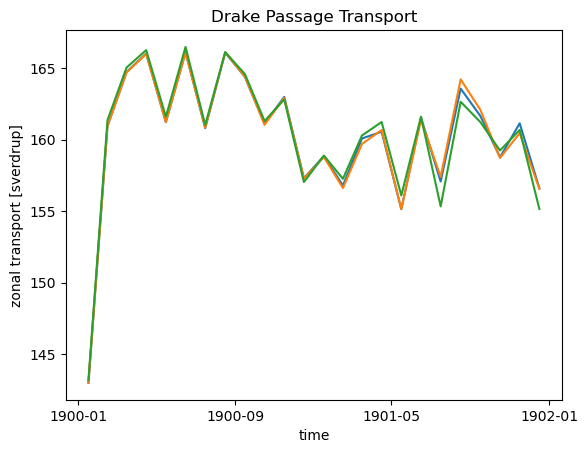

In [75]:
%%time
strait = 'Drake Passage'
transport = cal_transport(datastore_tot[-1], 'umo', strait, start_time='1900-01-01', end_time='1902-02-01')
print(transport)
transport.plot()
transport = cal_transport(datastore_tot[-2], 'umo', strait, start_time='1900-01-01', end_time='1902-02-01')
transport.plot()
transport = cal_transport(datastore_tot[-3], 'umo', strait, start_time='1900-01-01', end_time='1902-02-01')
transport.plot()
# transport = cal_transport(datastore_tot[-3], 'umo', strait, start_time='1900-01-01', end_time='1901-01-01')
# transport.plot()
plt.title(strait+' Transport');

# Drake Passage Transport

0
Calculating Drake Passage
2
Calculating Drake Passage
1
Calculating Drake Passage


<Figure size 640x480 with 0 Axes>

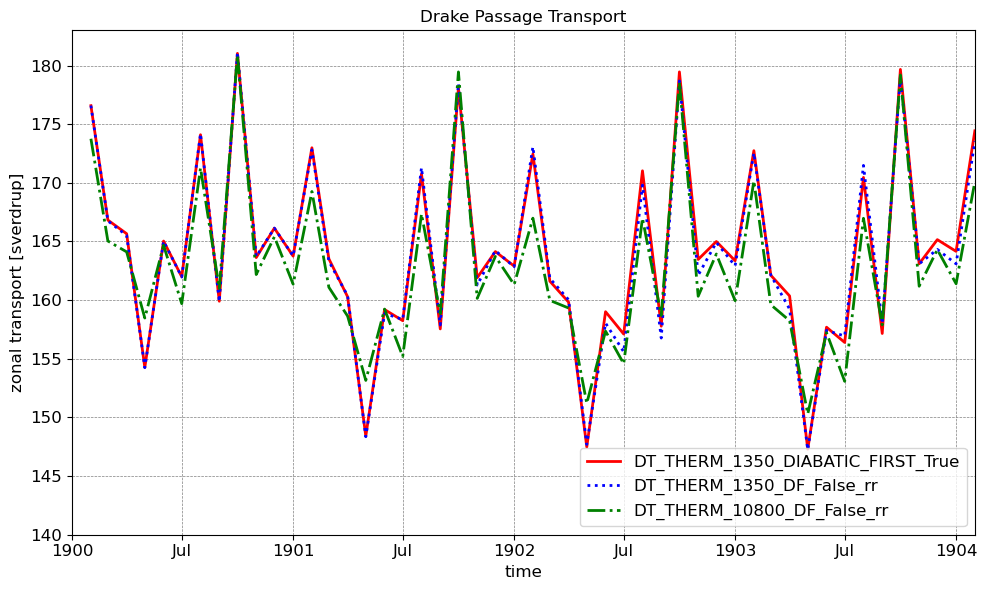

CPU times: user 41.1 s, sys: 1.67 s, total: 42.8 s
Wall time: 36.6 s


In [13]:
%%time
var = 'umo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Drake Passage Transport', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Drake Passage",
                        ylims = [140, 183],
                        )
plt.tight_layout()
pic_name = "Drake_Passage_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Drake Passage Transport Difference

Calculating Drake Passage
-1
Calculating Drake Passage
-2
Calculating Drake Passage
-3
Calculating Drake Passage
-4
Calculating Drake Passage


<Figure size 640x480 with 0 Axes>

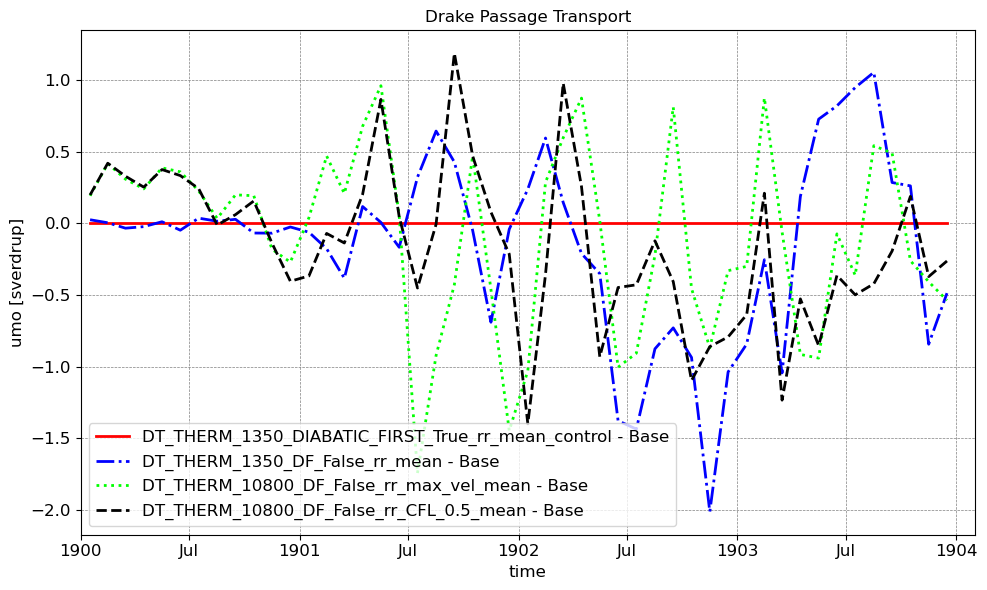

In [11]:
var = 'umo'
line_color = ['red','gold','pink','silver','cyan','black','lime','blue','red']
line_style = ['--',':','-.','-']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Drake Passage Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Drake Passage",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Drake_Passage_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Ombai Transport

0
Calculating Ombai
2
Calculating Ombai
1
Calculating Ombai


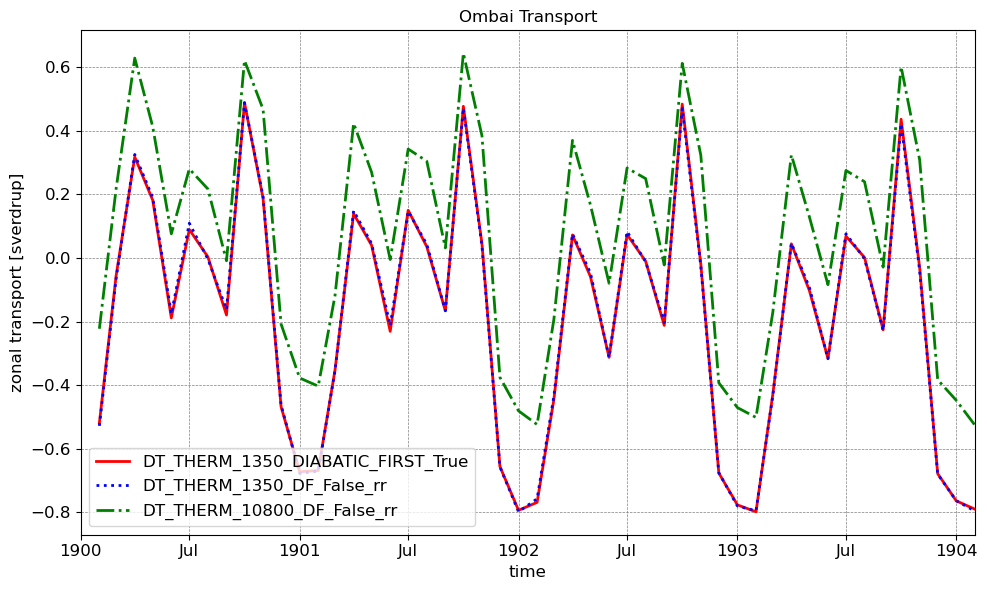

CPU times: user 48.7 s, sys: 5.9 s, total: 54.6 s
Wall time: 1min 7s


In [15]:
%%time
var = 'umo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Ombai Transport', 'base_index': None},
           ]
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Ombai",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Ombai_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Ombai Transport difference

Calculating Ombai
-1
Calculating Ombai
-2
Calculating Ombai
-3
Calculating Ombai
-4
Calculating Ombai


<Figure size 640x480 with 0 Axes>

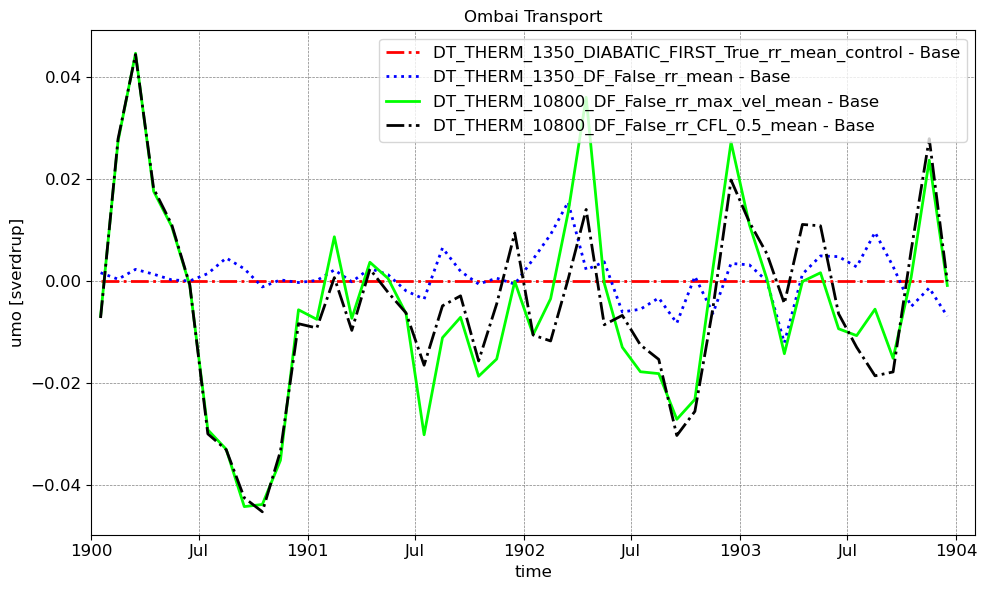

In [13]:
var = 'umo'
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Ombai Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Ombai",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Ombai_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Timor Transport

0
Calculating Timor
2
Calculating Timor
1
Calculating Timor


<Figure size 640x480 with 0 Axes>

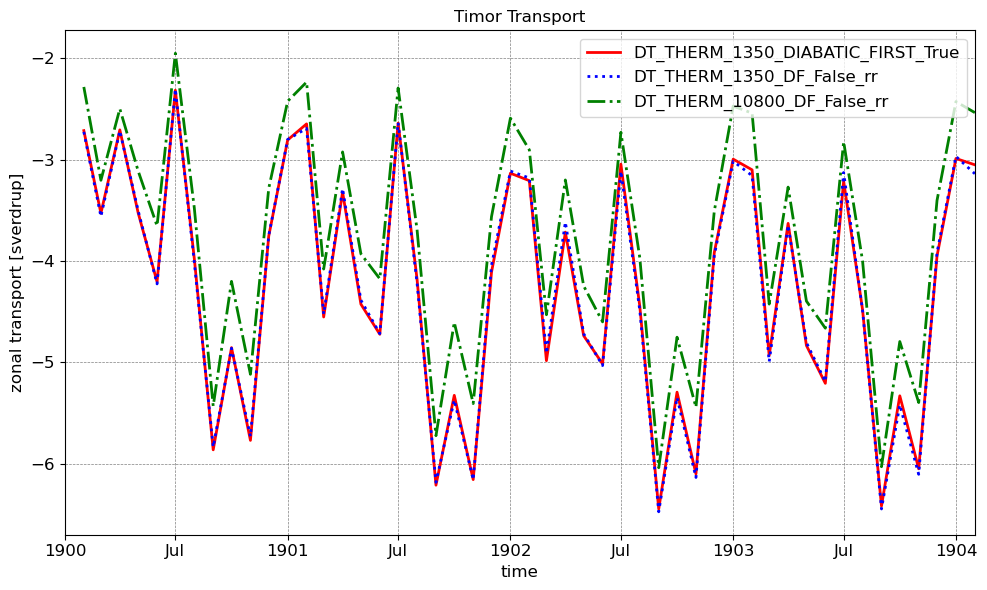

CPU times: user 33.9 s, sys: 5.6 s, total: 39.5 s
Wall time: 36.6 s


In [16]:
%%time
var = 'umo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Timor Transport', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Timor",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Timor_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Timor Transport difference

Calculating Timor
-1
Calculating Timor
-2
Calculating Timor
-3
Calculating Timor
-4
Calculating Timor


<Figure size 640x480 with 0 Axes>

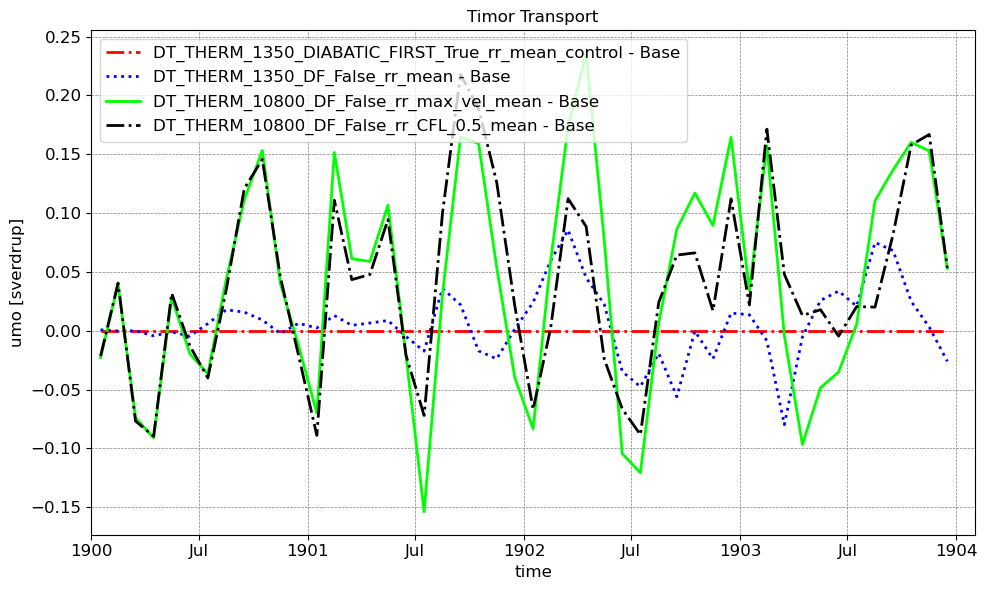

In [15]:
var = 'umo'
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Timor Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Timor",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Timor_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Lombok Transport

0
Calculating Lombok
2
Calculating Lombok
1
Calculating Lombok


<Figure size 640x480 with 0 Axes>

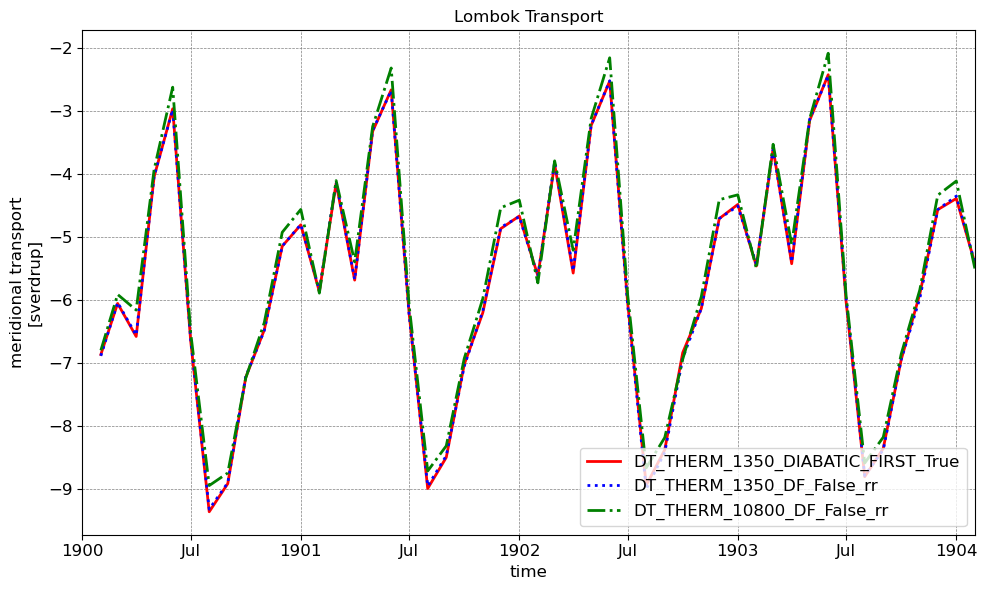

CPU times: user 49.1 s, sys: 7.4 s, total: 56.5 s
Wall time: 1min 16s


In [17]:
%%time
var = 'vmo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Lombok Transport', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Lombok",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Lombok_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Lombok Transport difference

Calculating Lombok
-1
Calculating Lombok
-2
Calculating Lombok
-3
Calculating Lombok
-4
Calculating Lombok


<Figure size 640x480 with 0 Axes>

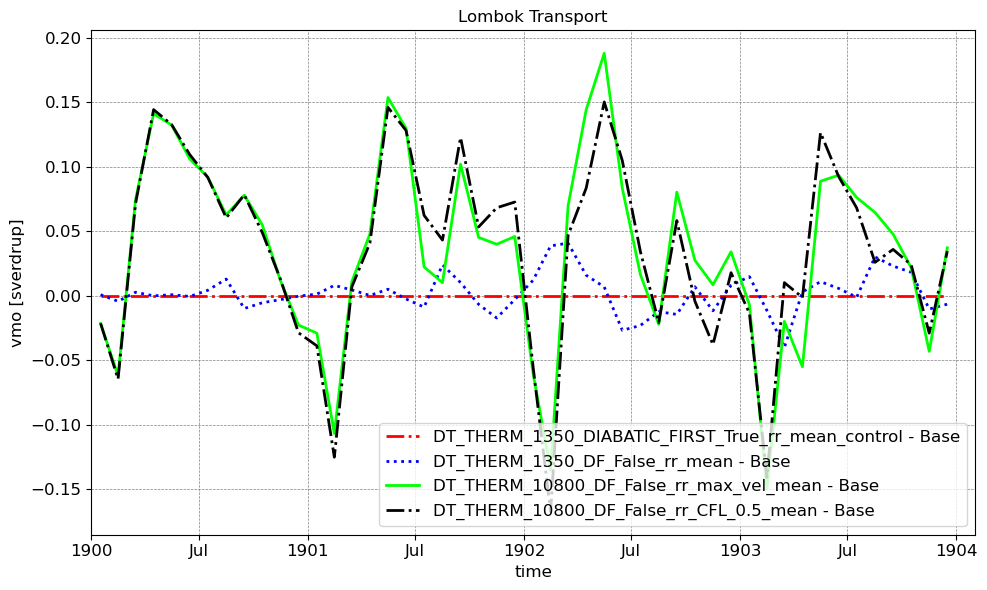

In [17]:
var = 'vmo'
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Lombok Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Lombok",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Lombok_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Denmark Transport

0
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
2
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
1
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark


<Figure size 640x480 with 0 Axes>

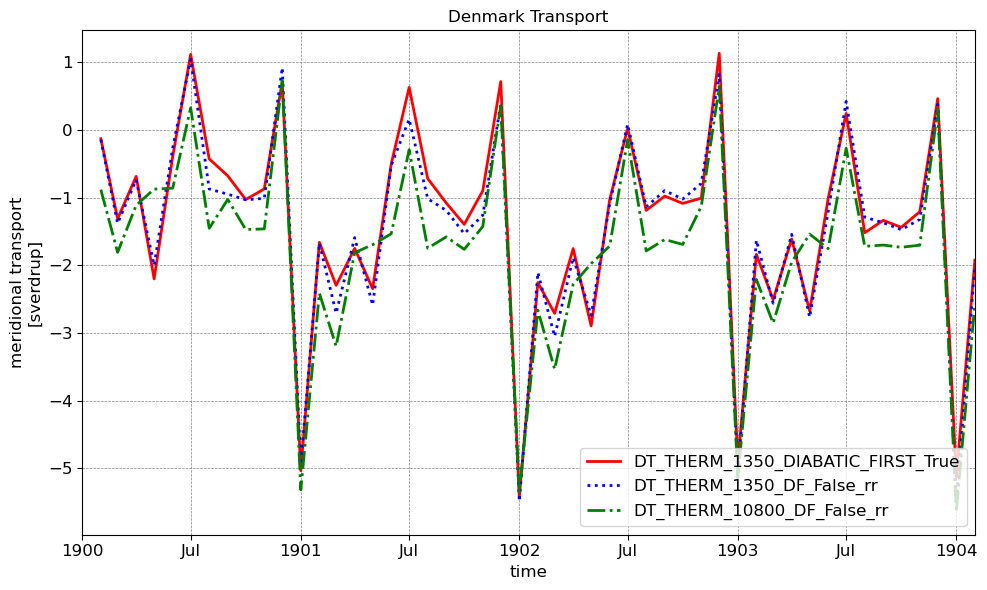

CPU times: user 1min 23s, sys: 7.96 s, total: 1min 31s
Wall time: 1min 52s


In [18]:
%%time
var = 'vmo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Denmark Transport', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Denmark",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Denmark_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Denmark Transport difference

North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
-1
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
-2
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
-3
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark
-4
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Denmark


<Figure size 640x480 with 0 Axes>

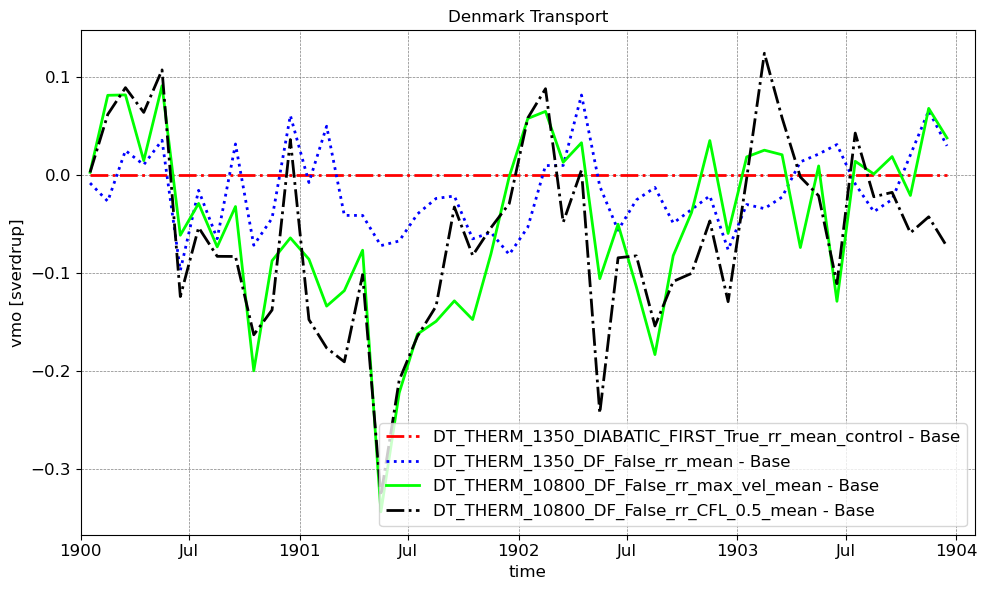

In [19]:
var = 'vmo'
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Denmark Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Denmark",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Denmark_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Bering Transport

0
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
2
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
1
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering


<Figure size 640x480 with 0 Axes>

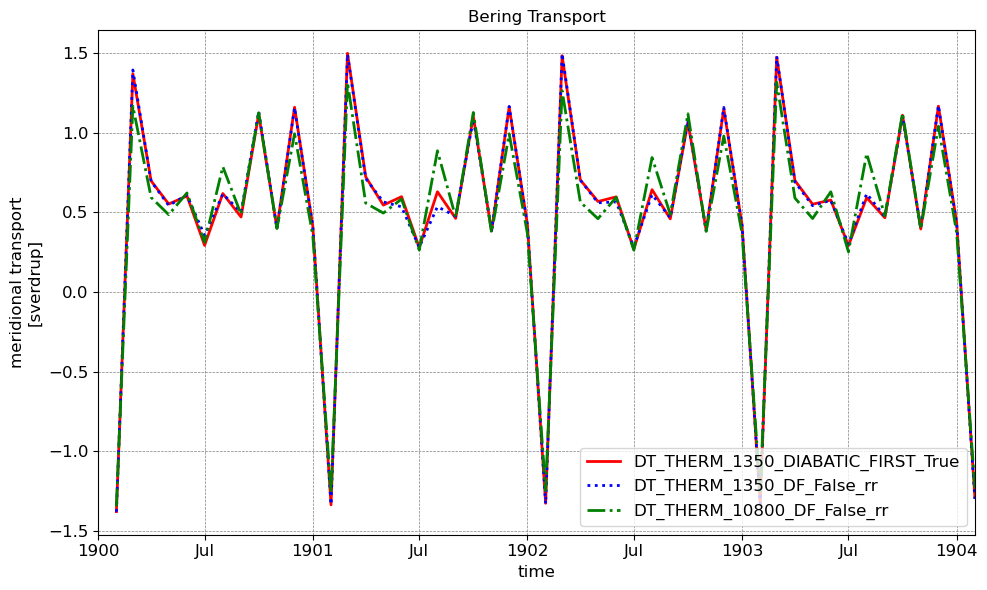

CPU times: user 41.5 s, sys: 3.84 s, total: 45.4 s
Wall time: 53.7 s


In [19]:
%%time
var = 'vmo'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Bering Transport', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Bering",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Bering_Transport3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Bering Transport difference

North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
-1
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
-2
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
-3
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering
-4
North of 65N the tripolar grid geometry brings complications and .sum('longitude') is wrong!
Calculating Bering


<Figure size 640x480 with 0 Axes>

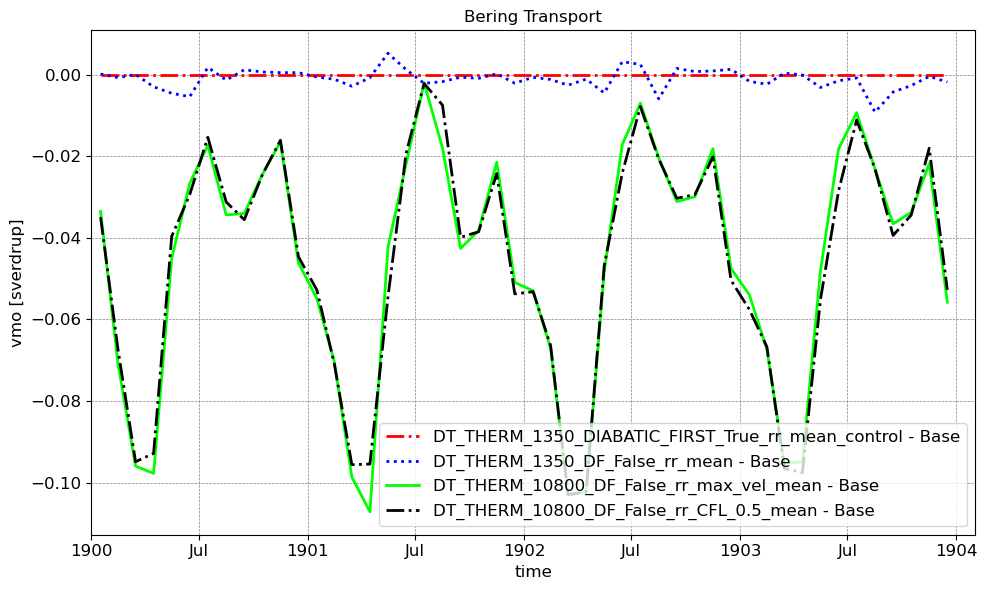

In [21]:
var = 'vmo'
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Bering Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        xlims = ('1900-01-01', '1904-02-01'),
                        use_subplots=False,
                        strait="Bering",
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Bering_Transport_diff2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

# Meridional Heat Transport

0
2
1


<Figure size 640x480 with 0 Axes>

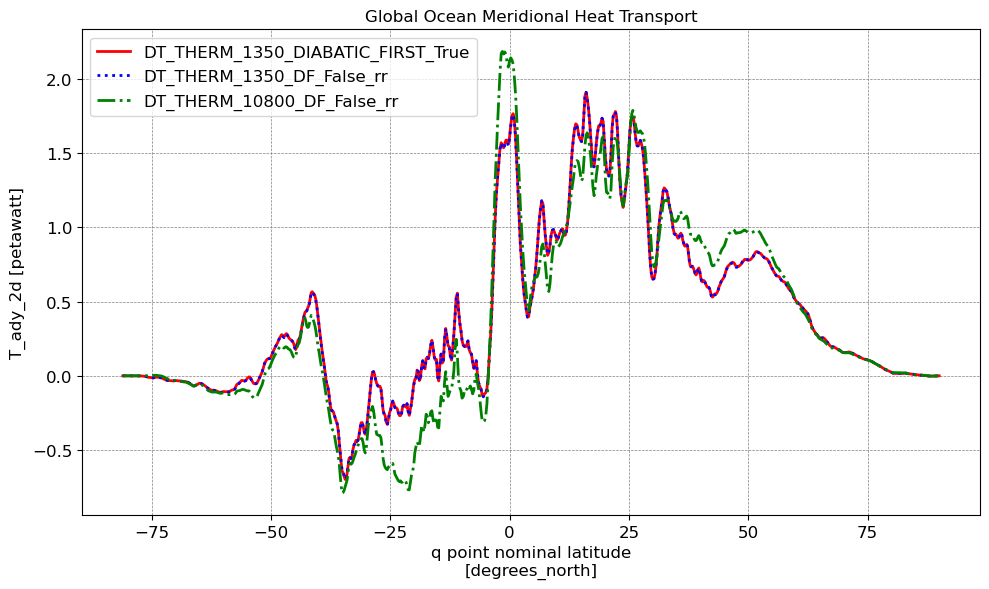

CPU times: user 13.4 s, sys: 1.41 s, total: 14.8 s
Wall time: 15.5 s


In [20]:
%%time
var = 'T_ady_2d'
line_color = ['red','green','blue','silver','cyan','black','lime','blue','red']
line_style = ['-','-.',':']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,2,1], 'title': 'Global Ocean Meridional Heat Transport', 'base_index': None},
           ]
plt.clf()

plot_time_series(
    datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        use_subplots=False,
                        x_axis_time = False,
                        #xlims = (-15,15),
                        MHT_1=True,
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Global Ocean Meridional Heat Transport_method1_3"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

-1
-2
-3
-4


<Figure size 640x480 with 0 Axes>

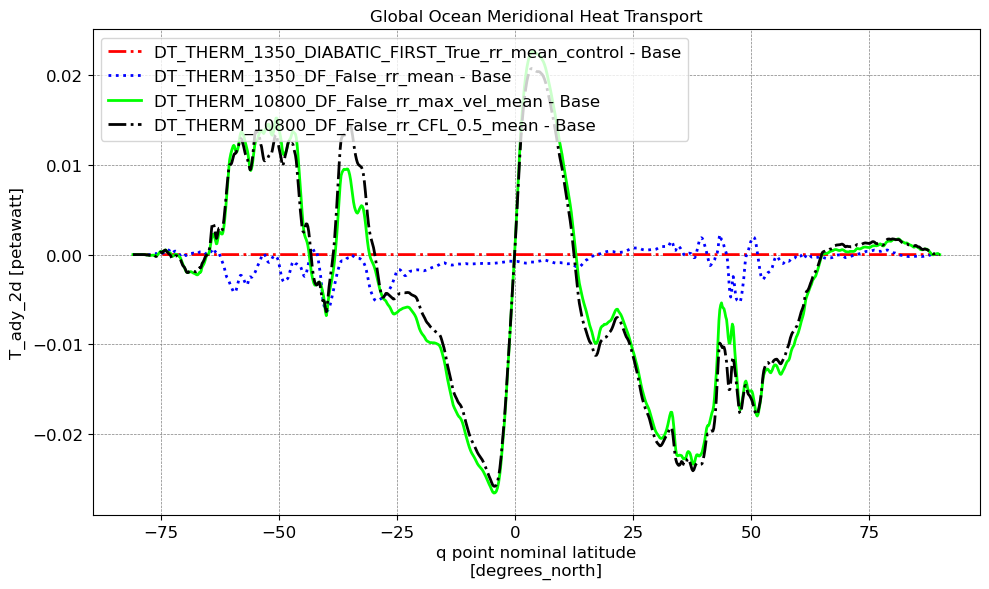

CPU times: user 22.1 s, sys: 836 ms, total: 22.9 s
Wall time: 17.2 s


In [23]:
%%time
var = 'T_ady_2d'
line_color = ['red','gold','pink','silver','cyan','black','lime','blue','red']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Global Ocean Meridional Heat Transport', 'base_index': -1},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1904-02-01'],
                        use_subplots=False,
                        x_axis_time = False,
                        #xlims = (-15,15),
                        MHT_1=True,
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "Global Ocean Meridional Heat Transport_method1_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

-1
-2
-3
-4
CPU times: user 11min 35s, sys: 1min 47s, total: 13min 23s
Wall time: 9min 9s


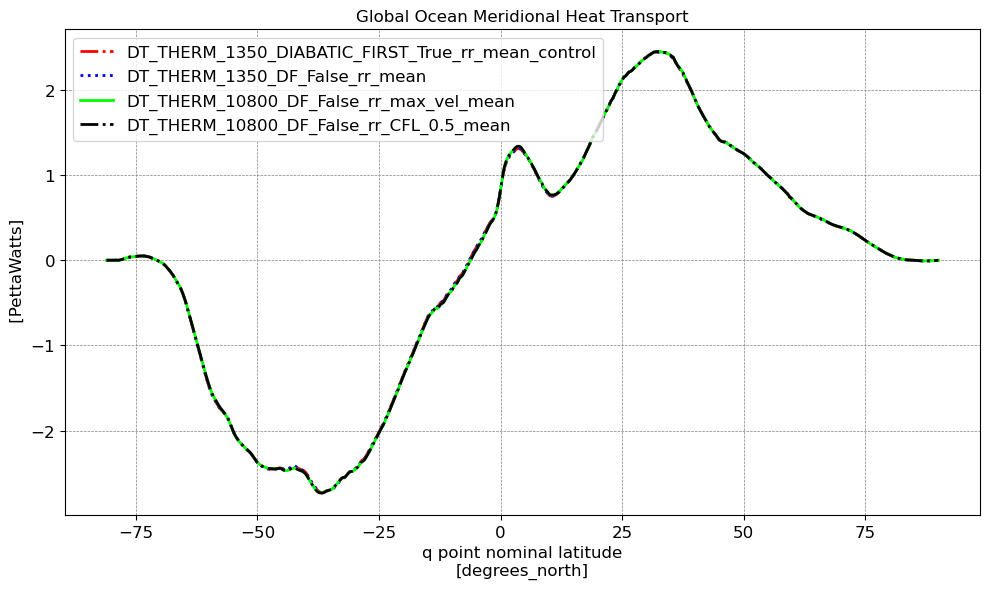

In [15]:
%%time
var = 'T_ady_2d'
line_color = ['red','gold','pink','silver','cyan','black','lime','blue','red']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Global Ocean Meridional Heat Transport', 'base_index': None},
           ]
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1902-02-01'],
                        use_subplots=False,
                        x_axis_time = False,
                        #xlims = (-15,15),
                        MHT_3=True,
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()

-1


UnboundLocalError: local variable 'base_data' referenced before assignment

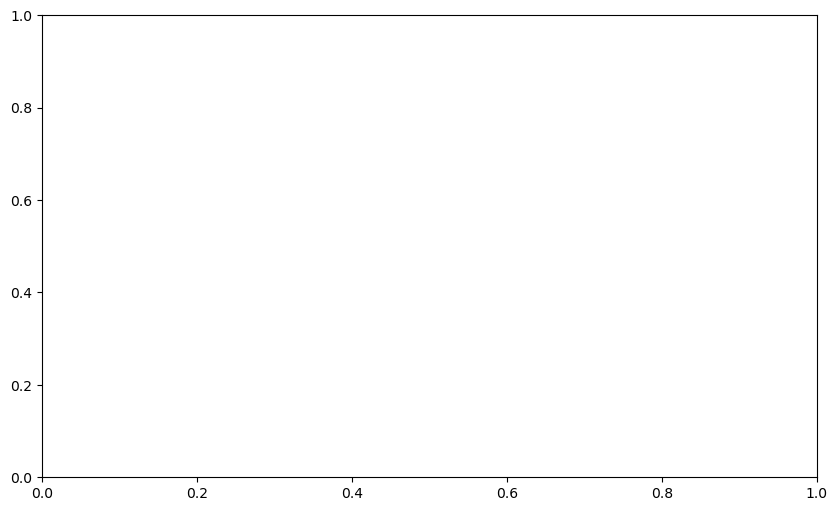

In [13]:
%%time
var = 'T_ady_2d'
line_color = ['red','gold','pink','silver','cyan','black','lime','blue','red']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1, -2, -3, -4], 'title': 'Global Ocean Meridional Heat Transport', 'base_index': -1},
           ]
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1902-02-01'],
                        use_subplots=False,
                        x_axis_time = False,
                        #xlims = (-15,15),
                        MHT_3=True,
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()

# Meridional Overturning Circulation (MOC)

0
1
2
3
CPU times: user 8min 28s, sys: 51.2 s, total: 9min 19s
Wall time: 14min 4s


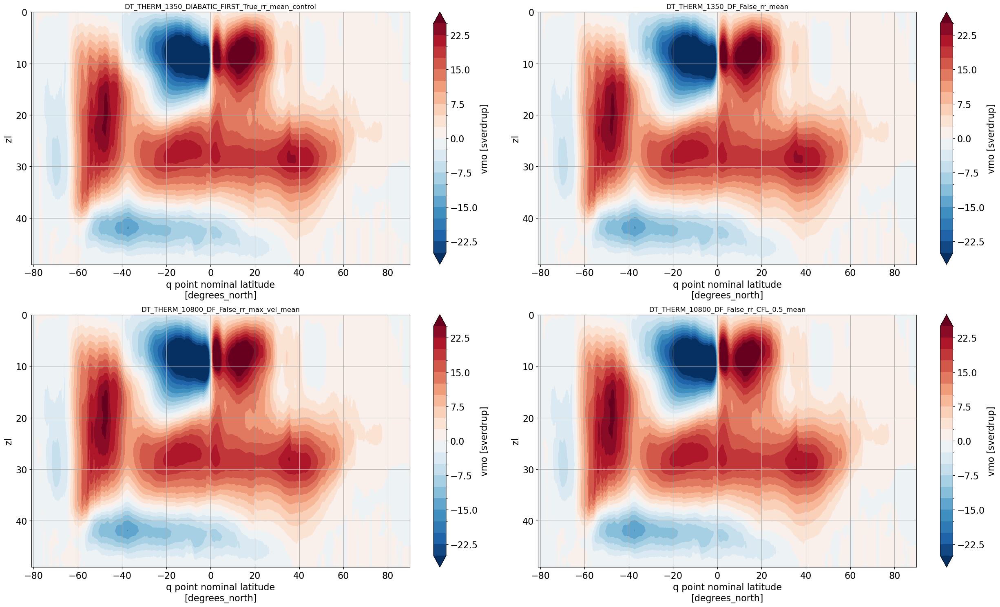

In [24]:
%%time
var = 'vmo'
tmp_indx = [-1, -2, -3, -4]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        time_selection = 'date_slice',
        start_time = '1900-01-01',
        end_time = '1904-01-01',
        ncols=2,
        figsize=(25,15),
        MOC = True,
        cf_sum_lon = True,
        cf_sum_vertical = True,
        cf_mean_time = True,
        yincrease = False,
        remap_vertical_to_depth_coord = False,
        cbar_range=[-25,25],
      )
plt.tight_layout()
# pic_name = "MOC"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

# plot2d(datastore_expts,
#         MOM_names_expts,
#         var,
#         depth_level = None,
#         common_time = common_time,ncols=2,figsize=(25,15),
#         cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
#         yincrease = False,
#         #cbar_range=[-0.02, 0.02],
#       )


-1


UnboundLocalError: local variable 'data' referenced before assignment

<Figure size 640x480 with 0 Axes>

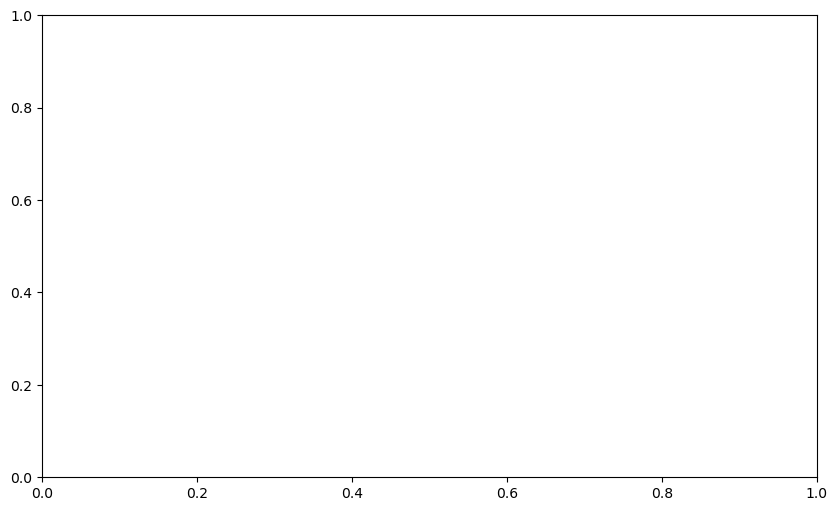

In [10]:
var = 'thetaoga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [-1,-2,-3,-4], 'title': 'DT_THERM', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1902-01-01'],
                        xlims = ('1900-01-01', '1902-01-01'),
                        use_subplots=False,
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
# pic_name = "mean_thetaoga_compare"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

0
-1


<Figure size 640x480 with 0 Axes>

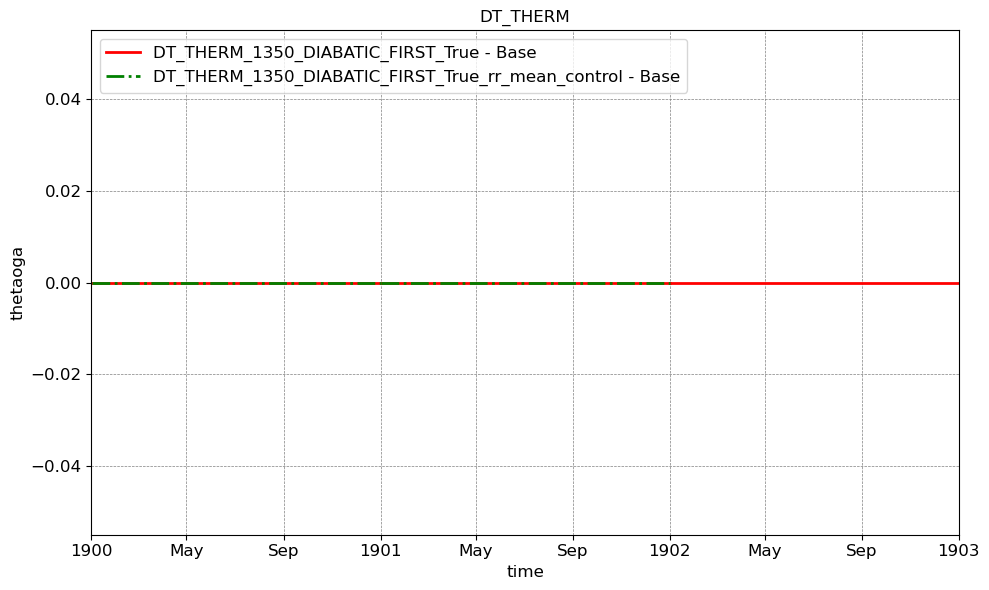

In [13]:
var = 'thetaoga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0,-1], 'title': 'DT_THERM', 'base_index': 0},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1903-01-01'],
                        xlims = ('1900-01-01', '1903-01-01'),
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()

<xarray.Dataset> Size: 6MB
Dimensions:   (yh: 1080, xq: 1440)
Coordinates:
  * xq        (xq) float64 12kB -279.8 -279.5 -279.2 -279.0 ... 79.5 79.75 80.0
  * yh        (yh) float64 9kB -81.08 -80.97 -80.87 -80.76 ... 89.74 89.84 89.95
Data variables:
    T_adx_2d  (yh, xq) float32 6MB dask.array<chunksize=(1080, 1440), meta=np.ndarray>
0
1
2
3


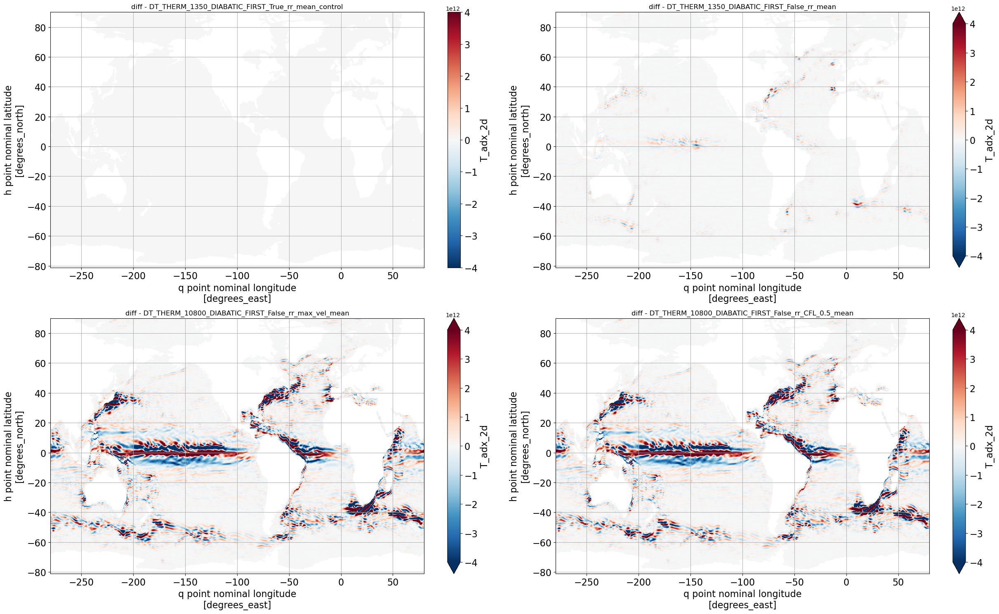

In [39]:
var = 'T_adx_2d'
tmp_indx = [-1, -2, -3, -4]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        #common_time = common_time,
        time_selection = 'date_slice',
        start_time = '1900-01-01',
        end_time = '1901-01-01',
        ncols=2,
        figsize=(25,15),
        cbar_range=[-4e12,4e12]
      )
plt.tight_layout()
# pic_name = "T_adx_2d_diff"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

<xarray.Dataset> Size: 6MB
Dimensions:   (yh: 1080, xq: 1440)
Coordinates:
  * xq        (xq) float64 12kB -279.8 -279.5 -279.2 -279.0 ... 79.5 79.75 80.0
  * yh        (yh) float64 9kB -81.08 -80.97 -80.87 -80.76 ... 89.74 89.84 89.95
Data variables:
    T_adx_2d  (yh, xq) float32 6MB dask.array<chunksize=(1080, 1440), meta=np.ndarray>
0
1
2
3


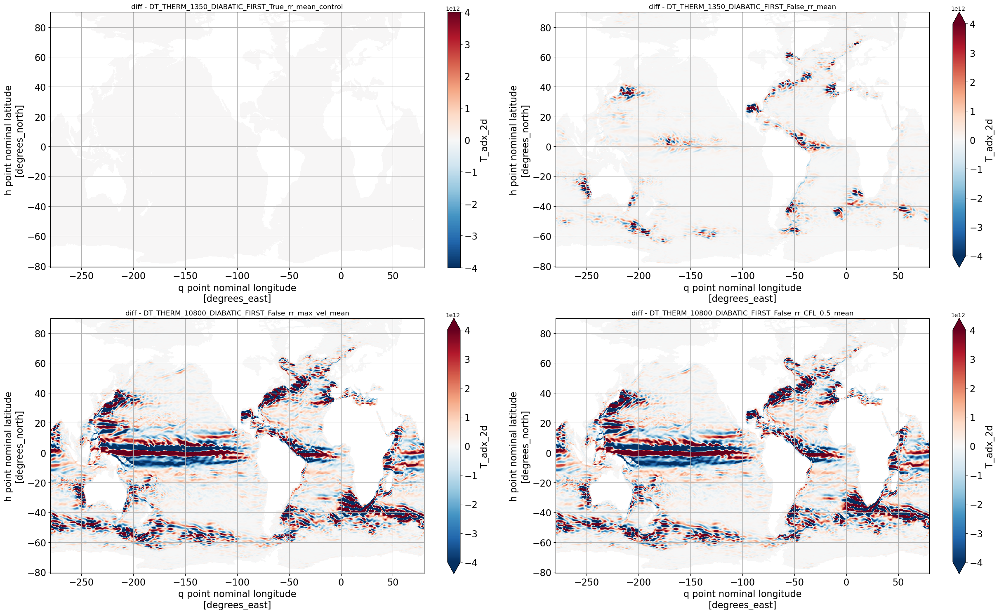

In [47]:
var = 'T_adx_2d'
tmp_indx = [-1, -2, -3, -4]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        #common_time = common_time,
        time_selection = 'date_slice',
        start_time = '1901-01-01',
        end_time = '1902-01-01',
        ncols=2,
        figsize=(25,15),
        cbar_range=[-4e12,4e12]
      )
plt.tight_layout()
# pic_name = "T_adx_2d_diff"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

0
1
2
3


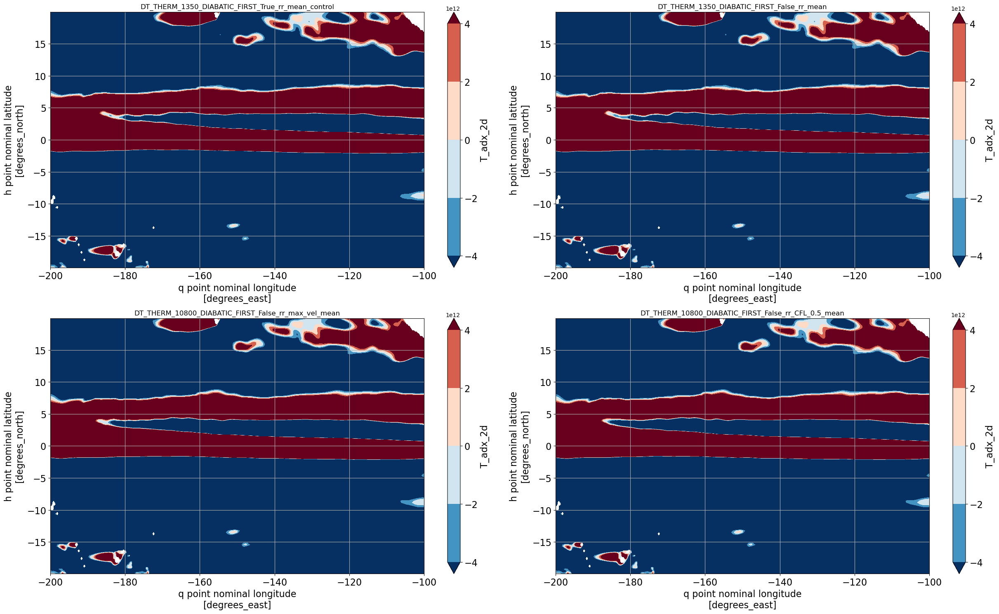

In [53]:
var = 'T_adx_2d'
tmp_indx = [-1, -2, -3, -4]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        # datastore_ctrl = datastore_expts[2],
        depth_level = None,
        time_selection = 'date_slice',
        start_time = '1901-01-01',
        end_time = '1902-01-01',
        xq_subset=slice(-200,-100),
        yh_subset=slice(-20,20),
        ncols=2,
        figsize=(25,15),
        cbar_range=[-4e12,4e12],
        levels=5,
      )
plt.tight_layout()
# pic_name = "T_adx_2d_diff"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

<xarray.Dataset> Size: 6MB
Dimensions:   (yh: 1080, xq: 1440)
Coordinates:
  * xq        (xq) float64 12kB -279.8 -279.5 -279.2 -279.0 ... 79.5 79.75 80.0
  * yh        (yh) float64 9kB -81.08 -80.97 -80.87 -80.76 ... 89.74 89.84 89.95
Data variables:
    T_adx_2d  (yh, xq) float32 6MB dask.array<chunksize=(1080, 1440), meta=np.ndarray>
0
1
2
3


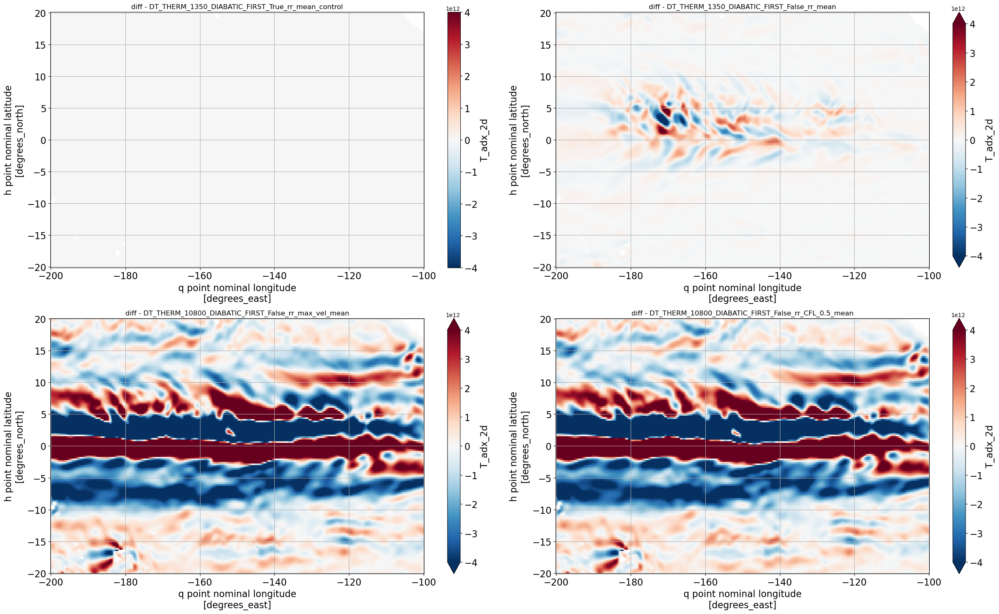

In [50]:
var = 'T_adx_2d'
tmp_indx = [-1, -2, -3, -4]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        time_selection = 'date_slice',
        start_time = '1901-01-01',
        end_time = '1902-01-01',
        xq_subset=slice(-200,-100),
        yh_subset=slice(-20,20),
        ncols=2,
        figsize=(25,15),
        cbar_range=[-4e12,4e12]
      )
plt.tight_layout()
# pic_name = "T_adx_2d_diff"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

0
-1
-2


<Figure size 640x480 with 0 Axes>

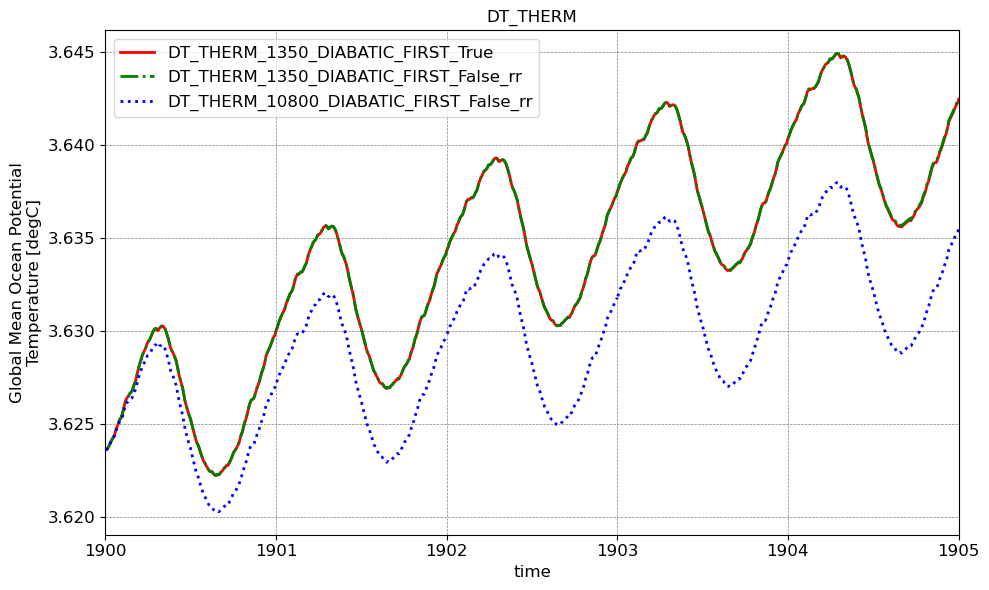

In [77]:
var = 'thetaoga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0, -1, -2], 'title': 'DT_THERM', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1905-01-01'],
                        xlims = ('1900-01-01', '1905-01-01'),
                        #ylims = [3.62, 3.65],
                        )
plt.tight_layout()
pic_name = "thetaoga_compare"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
-1
-2


<Figure size 640x480 with 0 Axes>

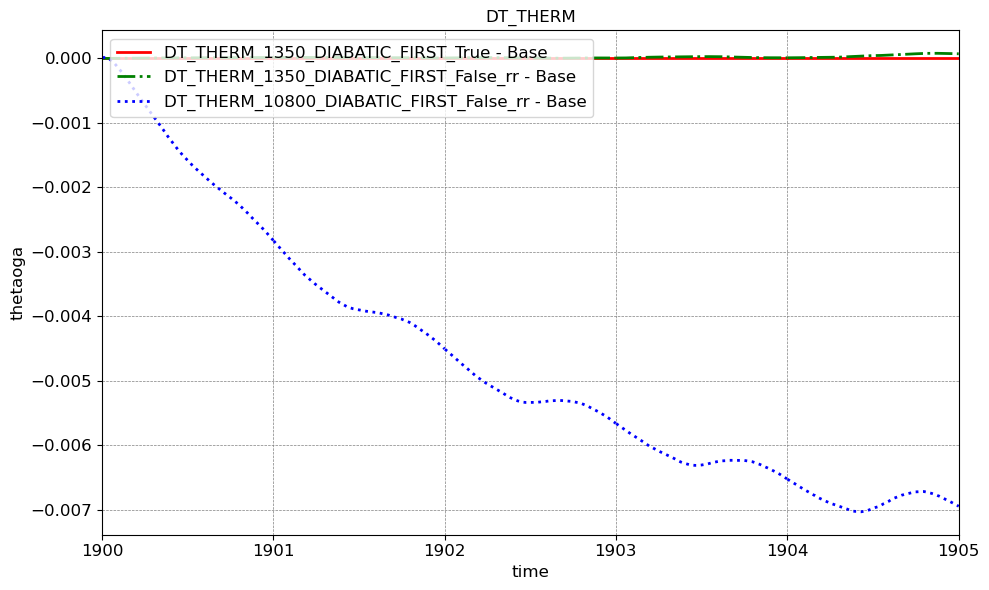

In [78]:
var = 'thetaoga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0, -1, -2], 'title': 'DT_THERM', 'base_index': 0},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'upper left',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1905-01-01'],
                        xlims = ('1900-01-01', '1905-01-01'),
                        )
plt.tight_layout()
pic_name = "thetaoga_compare_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
-1
-2


<Figure size 640x480 with 0 Axes>

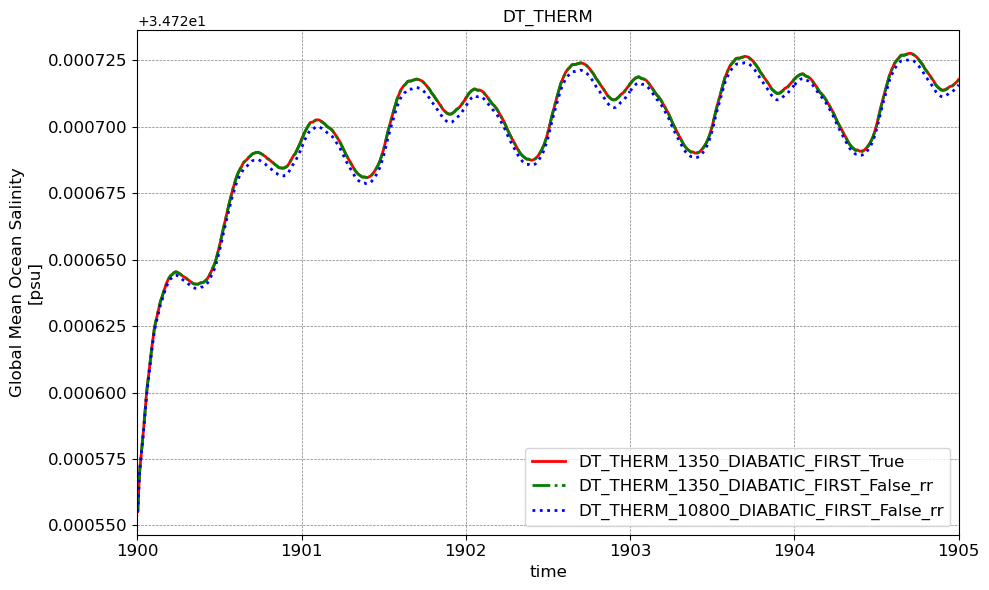

In [79]:
var = 'soga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0, -1, -2], 'title': 'DT_THERM', 'base_index': None},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'lower right',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1905-01-01'],
                        xlims = ('1900-01-01', '1905-01-01'),
                        )
plt.tight_layout()
pic_name = "soga_compare"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
-1
-2


<Figure size 640x480 with 0 Axes>

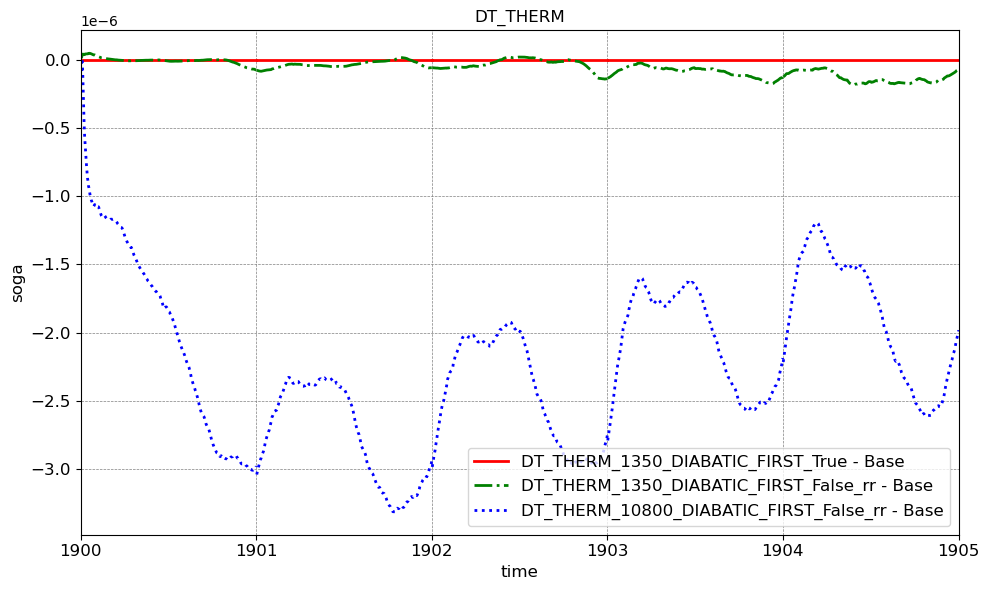

In [80]:
var = 'soga'
line_color = ['red','gold','pink','silver','cyan','black','purple','blue','green']
line_style = ['-',':','-.']
line_marker = ['o','s','v']
line_width = [2,2,2]
plots_config = [
            {'indices': [0, -1, -2], 'title': 'DT_THERM', 'base_index': 0},
           ]
plt.clf()
plot_time_series(datastore_tot,MOM_names_tot,var,
                        line_style=line_style,
                        line_color=line_color,
                        line_marker=line_marker,
                        line_width=line_width,
                        legend_loc = 'best',
                        legend_fontsize = 12,
                        plots_config=plots_config,
                        figsize=(10,6),
                        time_range = ['1900-01-01', '1905-01-01'],
                        xlims = ('1900-01-01', '1905-01-01'),
                        )
plt.tight_layout()
pic_name = "soga_compare_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


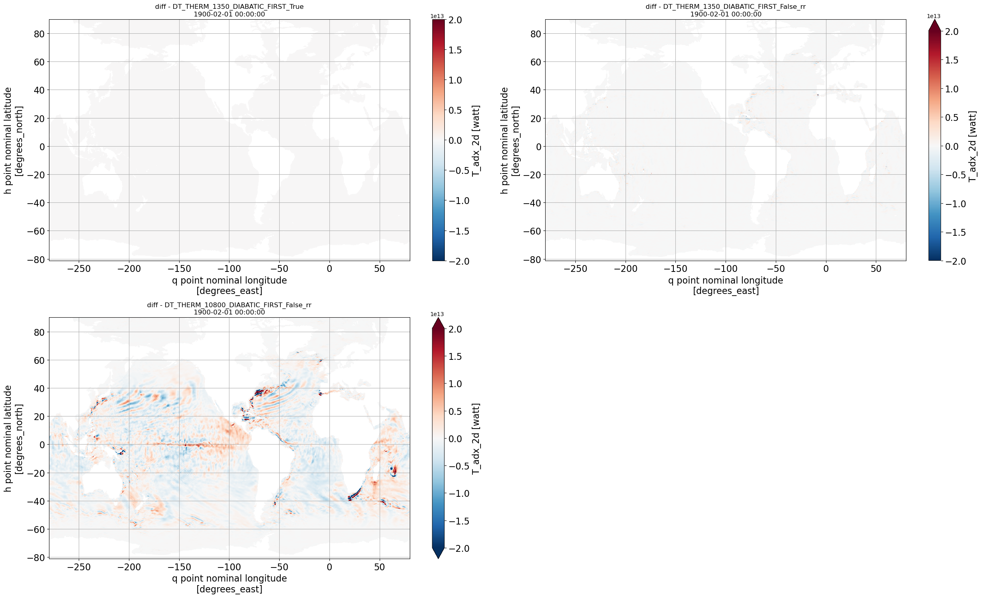

In [91]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cbar_range=[-2e13,2e13]
      )
plt.tight_layout()
pic_name = "T_adx_2d_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

[<intake_esm_ds catalog with 1984 dataset(s) from 2665 asset(s)>, <intake_esm_ds catalog with 454 dataset(s) from 602 asset(s)>, <intake_esm_ds catalog with 454 dataset(s) from 602 asset(s)>]
['DT_THERM_1350_DIABATIC_FIRST_True', 'DT_THERM_1350_DIABATIC_FIRST_False_rr', 'DT_THERM_10800_DIABATIC_FIRST_False_rr']
0
1
2


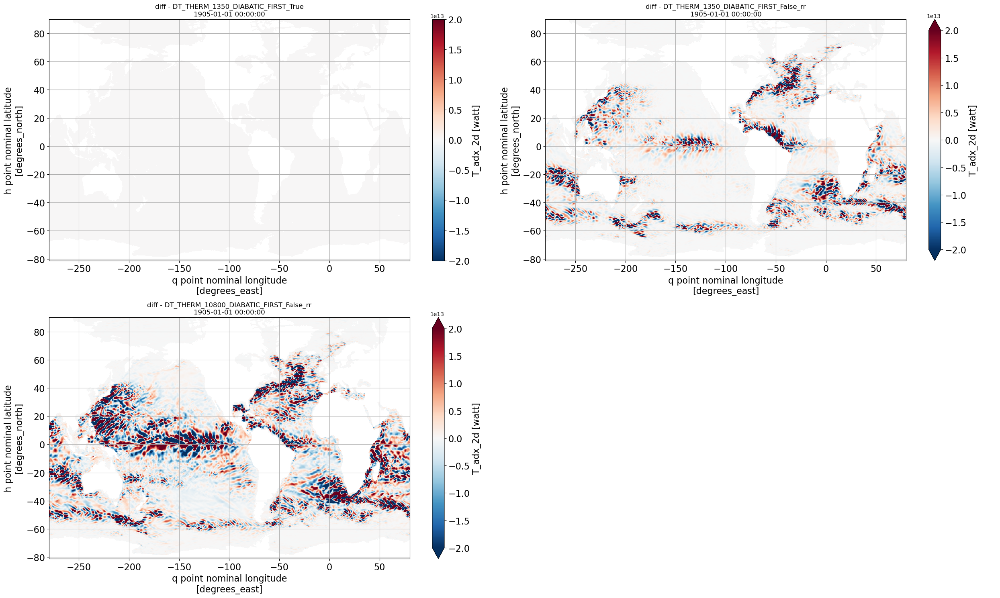

In [92]:
var = 'T_adx_2d'
common_time = pd.Timestamp('1905-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0, -1, -2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
print(datastore_expts)
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
print(MOM_names_expts)
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cbar_range=[-2e13,2e13]
      )
plt.tight_layout()
pic_name = "T_adx_2d_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


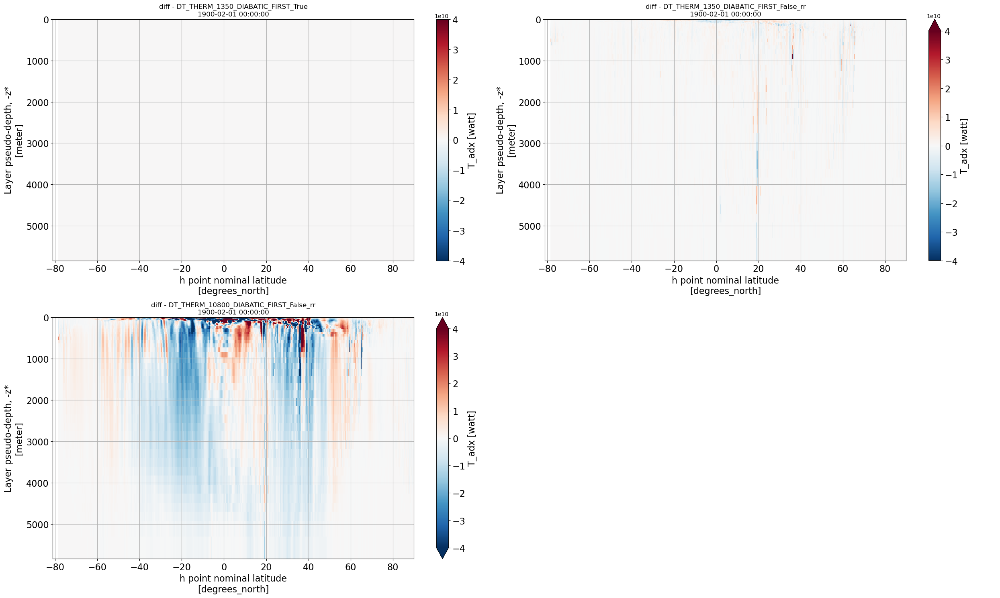

In [93]:
var = 'T_adx'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
        cbar_range=[-4e10, 4e10],
        yincrease = False,
      )
plt.tight_layout()
pic_name = "T_adx_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


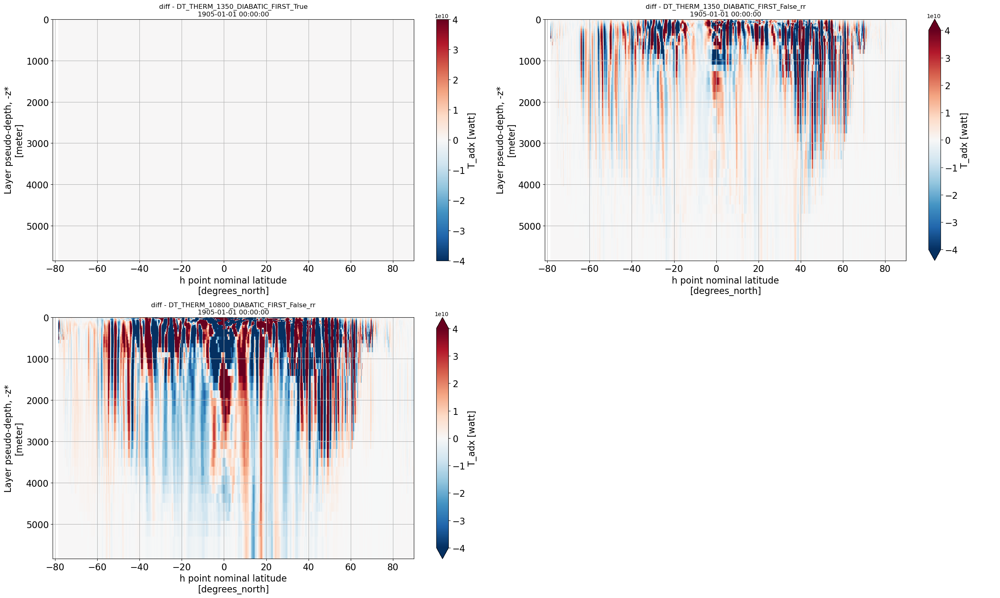

In [94]:
var = 'T_adx'
common_time = pd.Timestamp('1905-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
        cbar_range=[-4e10, 4e10],
        yincrease = False,
      )
plt.tight_layout()
pic_name = "T_adx_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
{'NumFilesInSet': 1, 'title': 'ACCESS-OM3', 'associated_files': 'areacello: access-om3.mom6.static.nc', 'grid_type': 'regular', 'grid_tile': 'N/A', 'intake_esm_vars': ['thetao'], 'intake_esm_attrs:path': '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/Ctrl-025deg_jra55do_ryf/archive/output017/access-om3.mom6.3d.thetao.1mon.snap.1917.nc', 'intake_esm_attrs:realm': 'ocean', 'intake_esm_attrs:variable': 'thetao', 'intake_esm_attrs:frequency': '1mon', 'intake_esm_attrs:start_date': '1917-02-01, 00:00:00', 'intake_esm_attrs:end_date': '1918-02-01, 00:00:00', 'intake_esm_attrs:variable_long_name': "['Sea Water Potential Temperature']", 'intake_esm_attrs:variable_standard_name': "['sea_water_potential_temperature']", 'intake_esm_attrs:variable_cell_methods': "['area:mean zl:mean yh:mean xh:mean time: point']", 'intake_esm_attrs:variable_units': "['degC']", 'intake_esm_attrs:filename': 'access-om3.mom6.3d.thetao.1mon.snap.1917.nc', 'intake_esm_attrs:fi

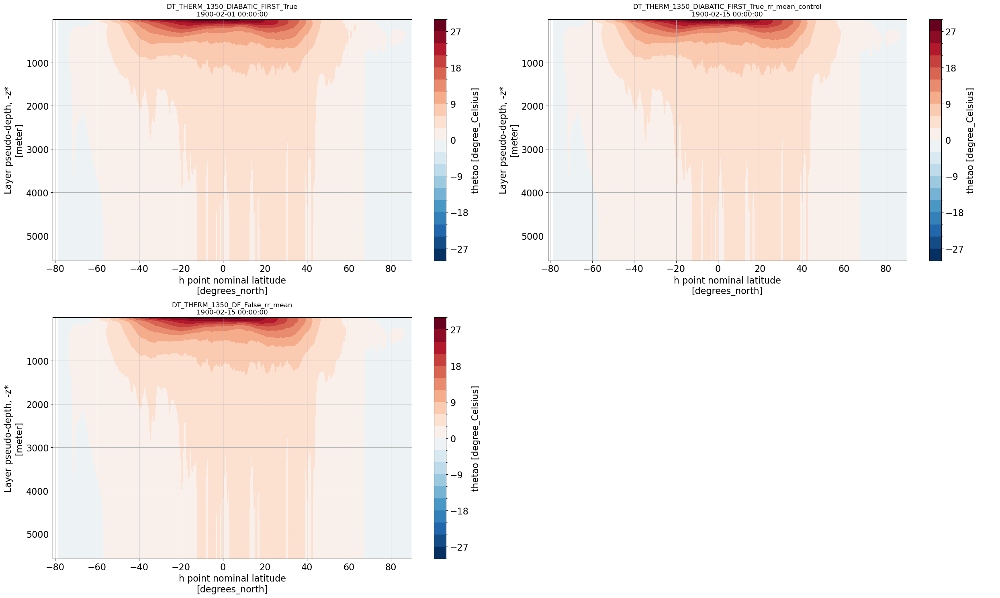

In [34]:
var = 'thetao'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
        yincrease = False,
        #cbar_range=[-0.02, 0.02],
      )
plt.tight_layout()
# pic_name = "thetao"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

0
{'NumFilesInSet': 1, 'title': 'ACCESS-OM3', 'associated_files': 'areacello: access-om3.mom6.static.nc', 'grid_type': 'regular', 'grid_tile': 'N/A', 'intake_esm_vars': ['thetao'], 'intake_esm_attrs:path': '/g/data/tm70/ml0072/COMMON/git_repos/COSIMA_om3-scripts/expts_manager/product1_0.25deg/Ctrl-025deg_jra55do_ryf/archive/output008/access-om3.mom6.3d.thetao.1mon.snap.1908.nc', 'intake_esm_attrs:realm': 'ocean', 'intake_esm_attrs:variable': 'thetao', 'intake_esm_attrs:frequency': '1mon', 'intake_esm_attrs:start_date': '1908-02-01, 00:00:00', 'intake_esm_attrs:end_date': '1909-02-01, 00:00:00', 'intake_esm_attrs:variable_long_name': "['Sea Water Potential Temperature']", 'intake_esm_attrs:variable_standard_name': "['sea_water_potential_temperature']", 'intake_esm_attrs:variable_cell_methods': "['area:mean zl:mean yh:mean xh:mean time: point']", 'intake_esm_attrs:variable_units': "['degC']", 'intake_esm_attrs:filename': 'access-om3.mom6.3d.thetao.1mon.snap.1908.nc', 'intake_esm_attrs:fi

ValueError: ('date is not consistent for the two datasets ', '1900-02-15 00:00:00 and 1900-02-01 00:00:00')

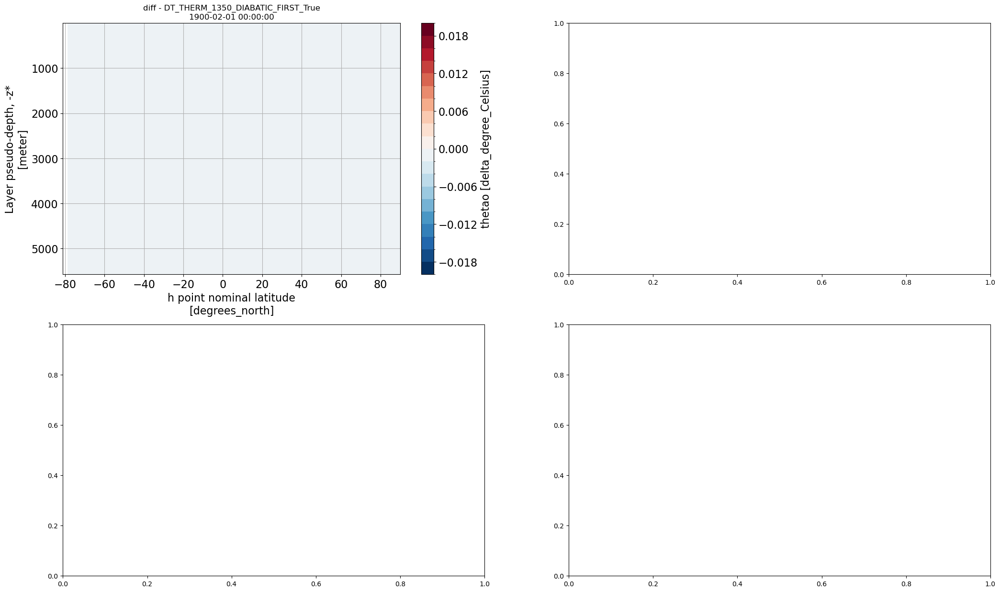

In [33]:
var = 'thetao'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
        yincrease = False,
        cbar_range=[-0.02, 0.02],
      )
plt.tight_layout()
# pic_name = "thetao_diff"
# file_path = os.path.join(pics_folder, pic_name+ ".png")
# plt.savefig(file_path,dpi=300)
# plt.show()

0
1
2


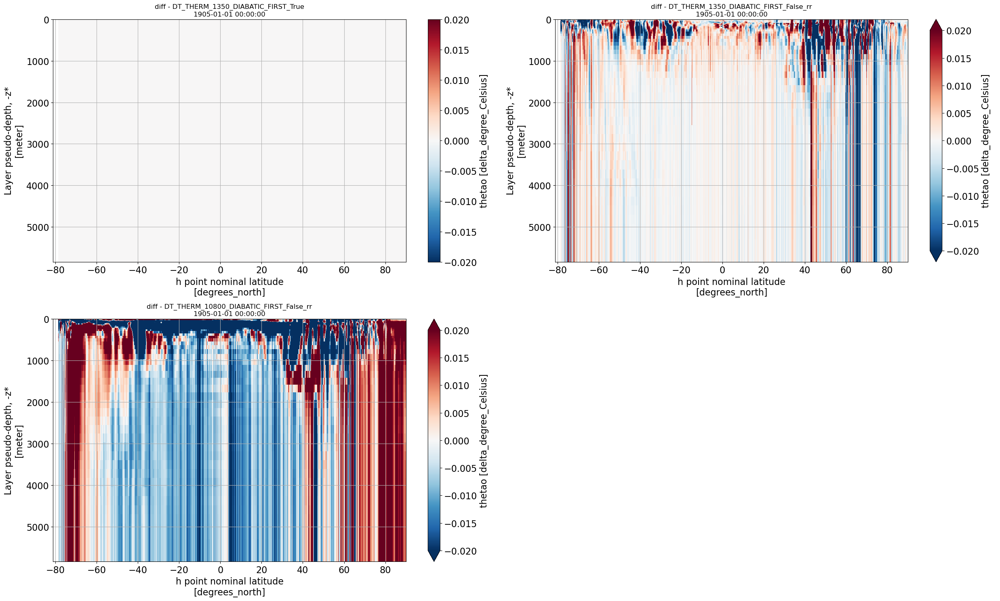

In [108]:
var = 'thetao'
common_time = pd.Timestamp('1905-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cf_sum_lon=False, cf_sum_vertical=False, cf_mean_time=False, cf_mean_lon=True,
        yincrease = False,
        cbar_range=[-0.02, 0.02],
      )
plt.tight_layout()
pic_name = "thetao_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


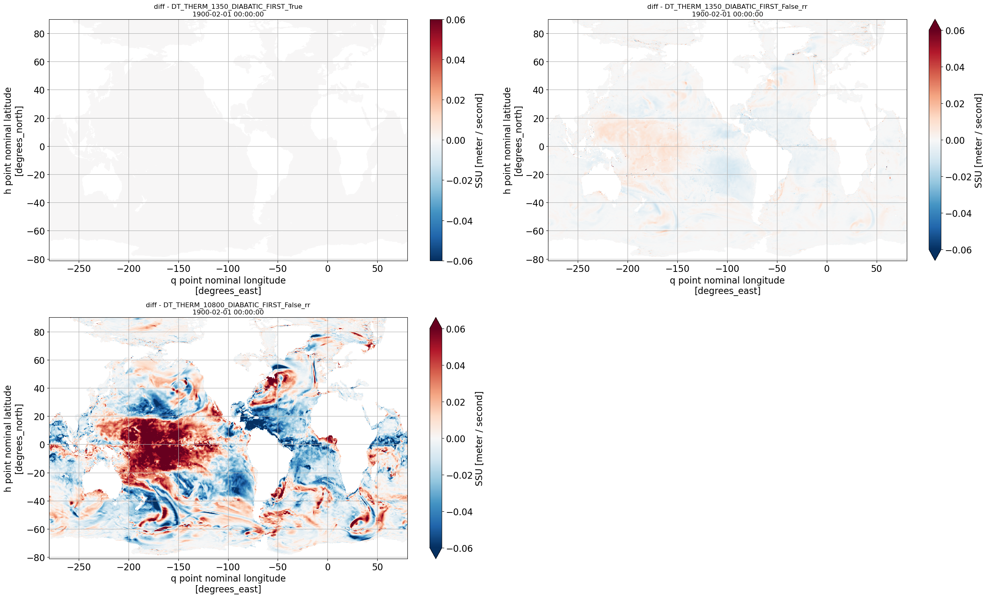

In [97]:
var = 'SSU'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        # xq_subset=slice(50,80),
        # yh_subset=slice(-40,-10),
        cbar_range=[-0.06, 0.06],
        )
plt.tight_layout()
pic_name = "SSU_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


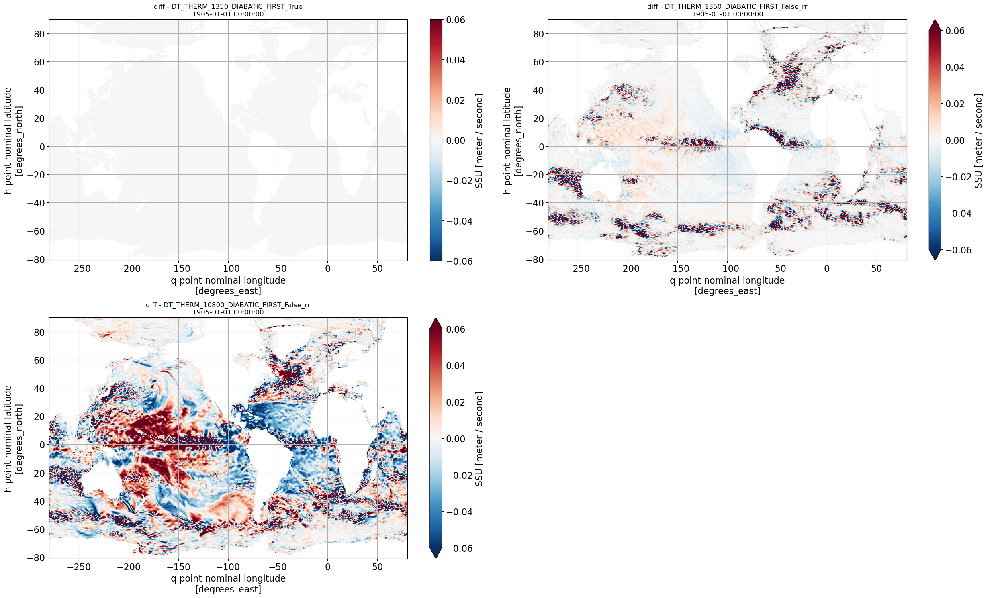

In [98]:
var = 'SSU'
common_time = pd.Timestamp('1905-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        # xq_subset=slice(50,80),
        # yh_subset=slice(-40,-10),
        cbar_range=[-0.06, 0.06],
        )
plt.tight_layout()
pic_name = "SSU_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


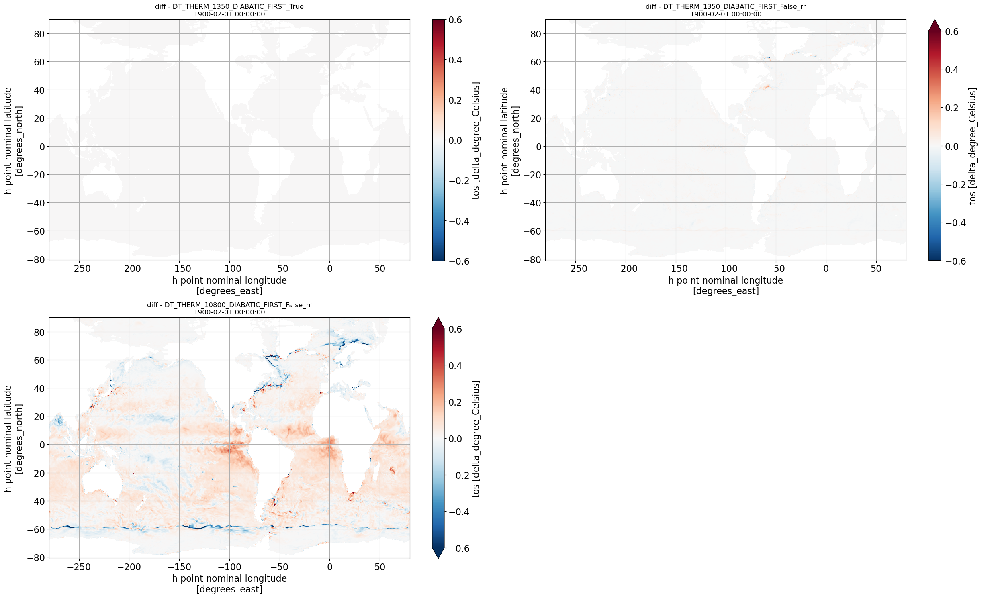

In [99]:
var = 'tos'
common_time = pd.Timestamp('1900-02-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cbar_range=[-0.6, 0.6],
      )
plt.tight_layout()
pic_name = "tos_diff"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()

0
1
2


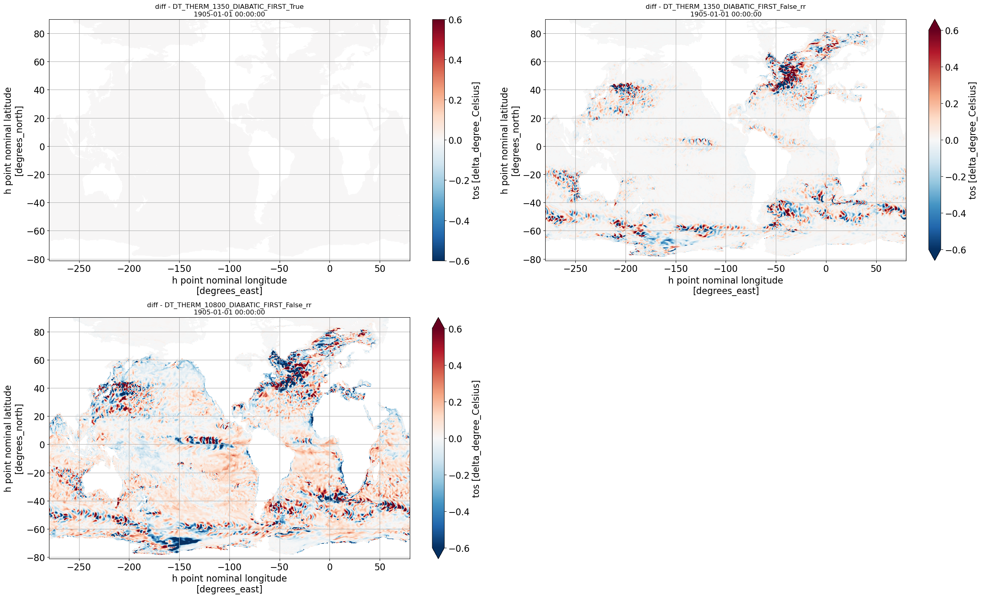

In [100]:
var = 'tos'
common_time = pd.Timestamp('1905-01-01 00:00:00')
common_time = cftime.DatetimeNoLeap(common_time.year, common_time.month, common_time.day, 
                                    common_time.hour, common_time.minute, common_time.second)
tmp_indx = [0,-1,-2]
datastore_expts = [datastore_tot[i] for i in tmp_indx]
MOM_names_expts = [MOM_names_tot[i] for i in tmp_indx]
plot2d(datastore_expts,
        MOM_names_expts,
        var,
        datastore_ctrl = datastore_expts[0],
        depth_level = None,
        common_time = common_time,ncols=2,figsize=(25,15),
        cbar_range=[-0.6, 0.6],
      )
plt.tight_layout()
pic_name = "tos_diff_2"
file_path = os.path.join(pics_folder, pic_name+ ".png")
plt.savefig(file_path,dpi=300)
plt.show()